In [7]:
import pandas as pd
import utils.misc as misc
from config import *
import yahoo_fin.stock_info as si
from yahooquery import Ticker
import os
from datetime import datetime, timedelta
from finvizfinance.screener.custom import Custom
import time
from glob import glob
import numpy as np
import sweetviz as sv

/opt/homebrew/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
#SCREENER
fcustom = Custom()
cols = [0,1,2,3,4,6,43,44,45,51,52,53,63,65,68]

mcap = '+Micro (over $50mln)'
filters_dict1 = {'Market Cap.': mcap}

fcustom.set_filter(filters_dict=filters_dict1)
df1 = fcustom.screener_view(columns=cols, sleep_sec = 1, order= 'Performance (Month)', ascend=False)
print(df1.shape[0], '\n')

In [4]:
ignore_filters = [ 'Closed-End Fund - Foreign', 'Closed-End Fund - Equity', 'Closed-End Fund - Debt', 'Shell Companies', 'Exchange Traded Fund', 'Asset Management']
filtered_stocks = df1.loc[~df1['Industry'].isin(ignore_filters)]
# del filtered_stocks['Unnamed: 0']

In [5]:
filtered_stocks.to_csv('../data/FINAL_US_STOCKS.csv')

In [7]:
print(filtered_stocks.shape)

(4457, 14)


PRE-PROCESSING
1. Re-ordering
2. Formatting
3. Column Names

In [8]:
os.chdir(gap_data)

In [81]:
def pre_processing(df):
    try:
        df.drop(columns={'Unnamed: 0'}, axis=1, inplace=True)
    except:
        pass
    df['Annual'] = df.apply(lambda x: 'Q4' in x.ReportingPeriod, axis=1)
    df['Avg_DV'] = df['Avg_Vol_20'] * df['C1']
    new_cols = ['exdate',
                'C1 date',
                'weekday',
                'ReportingPeriod',
                'Annual',
                'Sector',
                'Industry',
                'MktCap',
                'Gap%',
                'O',
                'H',
                'L',
                'C',
                'v0',
                'C1',
                'v1',
                'avg_v20',
                'Avg_DV',
                '52WH_dist',
                '52WH_recency',
                '52WL_dist',
                '52WL_recency',
                '65DL_dist',
                'reportedEPS',
                'estimatedEPS',
                'surprise',
                'surprise%',
                'reportedRev',
                'estimatedRev',
                'revenueSurprise%',
                'tr_returns',
                'tr_high',
                'tr_dth',
                'tr_low',
                'tr_dtl',
                'tr_high_returns',
                'method',
                'bh_returns',
                'bh_high',
                'bh_dth',
                'bh_low',
                'bh_dtl',
                'bh_high_returns']
    df = df[new_cols]
    df.rename(columns={'exdate': 'T0', 'C1 date': 'T1', 'weekday': 'Day', 'MktCap': 'M_Cap', 'v0': 'V', 'v1': 'V1', 'avg_v20': 'Avg_Vol_20'}, inplace=True)
    df = df.round(2)
    return df

In [9]:
ticker = "AAPL"
df = pd.read_csv(f"{ticker}_EP.csv")

In [75]:
df.iloc[0].ReportingPeriod

'Q4/1997'

In [38]:
files = glob('*')

In [39]:
len(files)

3407

In [45]:
for f in files:
    print(f)
    ticker = f.split('_')[0]
    outfile = f"{ticker}_EP.csv"
    if outfile in files or ('GAP' not in f):
        continue
    df = pd.read_csv(f)
    try:
        df = pre_processing(df)
        df.to_csv(outfile)
    except:
        print(f'Error for {ticker}')
    # break

CDAY_GAP_TABLE.csv
PRDO_GAP_TABLE.csv
MPX_GAP_TABLE.csv
MAS_GAP_TABLE.csv
SILC_GAP_TABLE.csv
KMPH_GAP_TABLE.csv
U_GAP_TABLE.csv
ETR_GAP_TABLE.csv
THM_GAP_TABLE.csv
Error for THM
ATRC_GAP_TABLE.csv
ACIU_GAP_TABLE.csv
FRPT_GAP_TABLE.csv
CGAU_GAP_TABLE.csv
OUT_GAP_TABLE.csv
RDI_GAP_TABLE.csv
BRKR_GAP_TABLE.csv
MODG_GAP_TABLE.csv
SPB_GAP_TABLE.csv
PFSI_GAP_TABLE.csv
HFWA_GAP_TABLE.csv
OCN_GAP_TABLE.csv
FRGI_GAP_TABLE.csv
VTEX_GAP_TABLE.csv
MMLP_GAP_TABLE.csv
BLFS_GAP_TABLE.csv
JRVR_GAP_TABLE.csv
APA_GAP_TABLE.csv
IMMP_GAP_TABLE.csv
Error for IMMP
CNMD_GAP_TABLE.csv
ACHR_GAP_TABLE.csv
Error for ACHR
MHLD_GAP_TABLE.csv
CSAN_GAP_TABLE.csv
VIST_GAP_TABLE.csv
CODX_GAP_TABLE.csv
XENE_GAP_TABLE.csv
GEOS_GAP_TABLE.csv
BEKE_GAP_TABLE.csv
CLDT_GAP_TABLE.csv
MMSI_GAP_TABLE.csv
TRMK_GAP_TABLE.csv
FITB_GAP_TABLE.csv
SIM_GAP_TABLE.csv
DCP_GAP_TABLE.csv
LFCR_GAP_TABLE.csv
FOXF_GAP_TABLE.csv
CGEM_GAP_TABLE.csv
STZ_GAP_TABLE.csv
BC_GAP_TABLE.csv
FULC_GAP_TABLE.csv
IMUX_GAP_TABLE.csv
PACB_GAP_TABLE.csv
BCH_

#Delete files which have an EP table

In [53]:
for f in files2:
    print(f)
    try:
        os.remove(f.replace('EP','GAP_TABLE'))
    except:
        continue

CRMD_EP.csv
BCH_EP.csv
CABA_EP.csv
SANA_EP.csv
CPG_EP.csv
LPSN_EP.csv
STE_EP.csv
SRAD_EP.csv
KOPN_EP.csv
TEF_EP.csv
CBNK_EP.csv
CR_EP.csv
AMBP_EP.csv
LITE_EP.csv
TEAM_EP.csv
DXCM_EP.csv
LVO_EP.csv
IBCP_EP.csv
RCKY_EP.csv
MAS_EP.csv
LICY_EP.csv
NREF_EP.csv
BSY_EP.csv
CODI_EP.csv
RCII_EP.csv
RM_EP.csv
CUZ_EP.csv
AZN_EP.csv
NRGV_EP.csv
ABEV_EP.csv
VTNR_EP.csv
MPLN_EP.csv
DCT_EP.csv
JRVR_EP.csv
CFFN_EP.csv
LPL_EP.csv
CTMX_EP.csv
EMBK_EP.csv
ESTC_EP.csv
QS_EP.csv
AMTB_EP.csv
IIIN_EP.csv
ESE_EP.csv
MOND_EP.csv
HSON_EP.csv
CBOE_EP.csv
BAX_EP.csv
ALGM_EP.csv
LFCR_EP.csv
CACC_EP.csv
MSGE_EP.csv
BSET_EP.csv
BRAG_EP.csv
FLL_EP.csv
SMAR_EP.csv
ETD_EP.csv
MHLD_EP.csv
BYND_EP.csv
CPTN_EP.csv
EDU_EP.csv
TNXP_EP.csv
CCOI_EP.csv
SEV_EP.csv
FC_EP.csv
OXY_EP.csv
CAT_EP.csv
QUOT_EP.csv
BP_EP.csv
FOR_EP.csv
AMCR_EP.csv
KEP_EP.csv
BVH_EP.csv
SGMO_EP.csv
ESI_EP.csv
USX_EP.csv
NYXH_EP.csv
PRPH_EP.csv
MDB_EP.csv
TCRR_EP.csv
DCOM_EP.csv
RBLX_EP.csv
ALRM_EP.csv
SO_EP.csv
MBUU_EP.csv
IONS_EP.csv
PINE_EP.csv
ITRN_

1. Define Universe of Stocks: All U.S. stocks listed > $50M in MCap in March '22 => 4457 Stocks
2. Define Study Period: Should cover atleast 2 complete bull & bear cycles | Data should be present for said period - 
3. Define Setup: Episodic Pivot

Episodic Pivot Criterias:
1. C1 > $1
2. Avg Dollar Vol > $1M
3. Market Cap (C1) > $ 50M
4. Gap > +3% 

Data Validation:
1. Check for all fields for a couple of stocks -> Sample should include stocks which release earnings both AMC & BMO
2. Sample Stocks -> 

ANALYSIS


1. SWEETVIZ (W/O TARGET)

/opt/homebrew/lib/python3.10/site-packages/sweetviz/dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
/opt/homebrew/lib/python3.10/site-packages/sweetviz/dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()
Feature: Unnamed: 0                          |▏         | [  2%]   00:00 -> (00:00 left)/opt/homebrew/lib/python3.10/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
Feature: T0                                  |▍         | [  5%]   00:00 -> (00:09 left)/opt/homebrew/lib/pyt


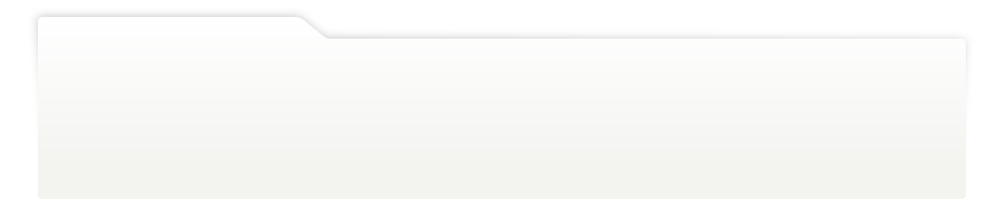
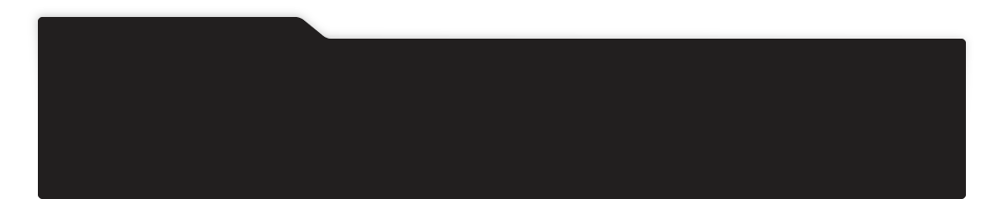
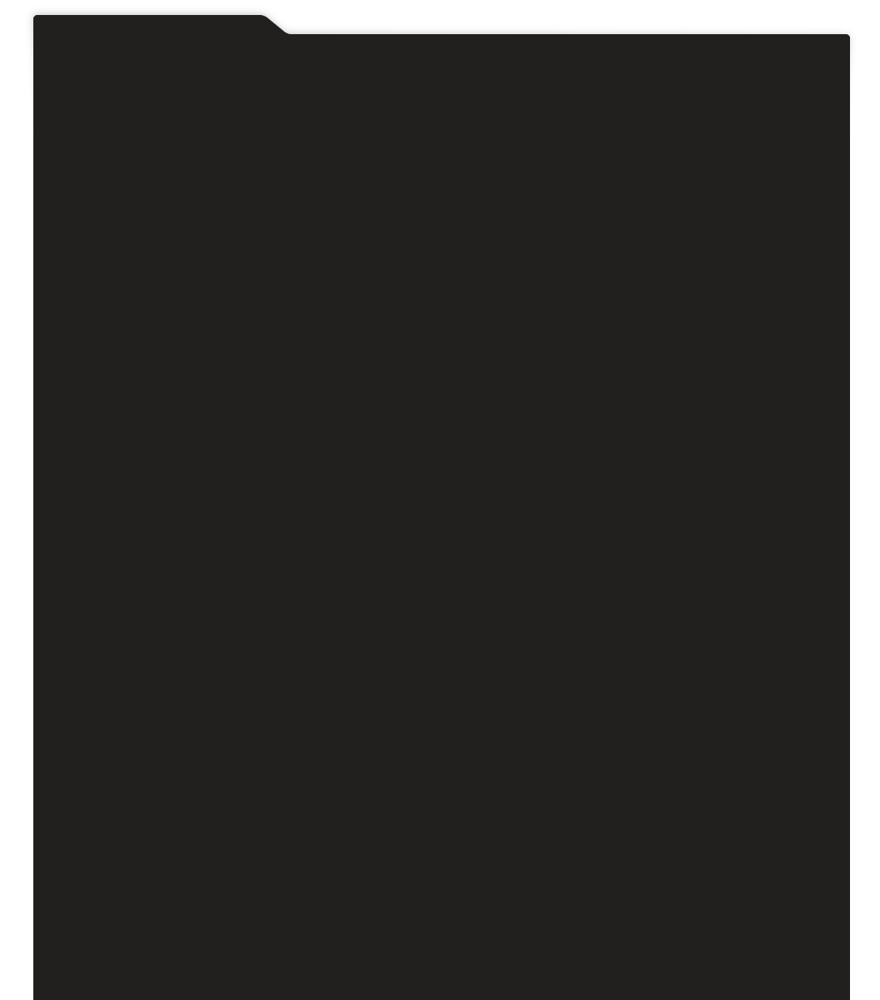
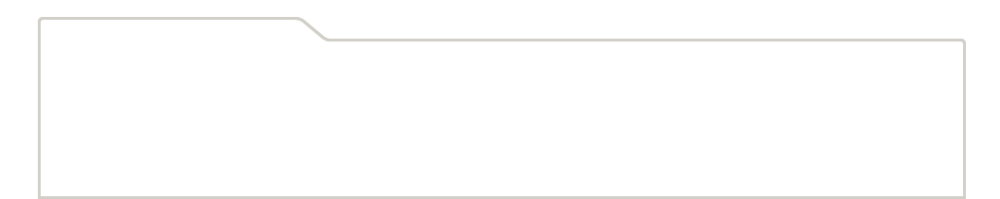
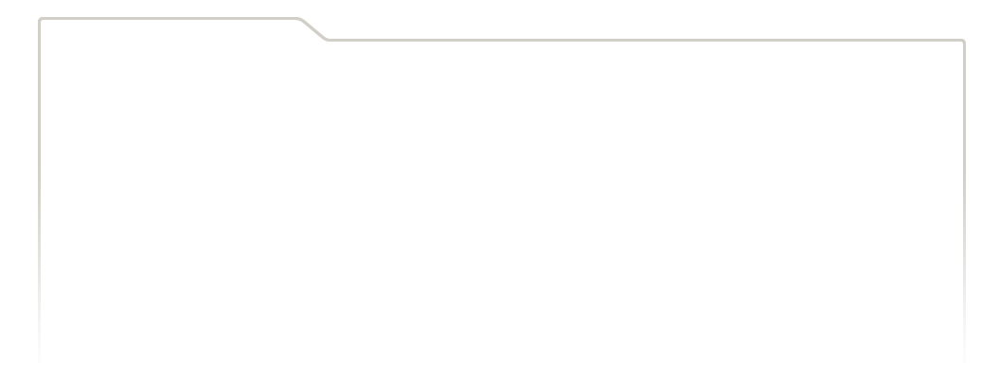
...
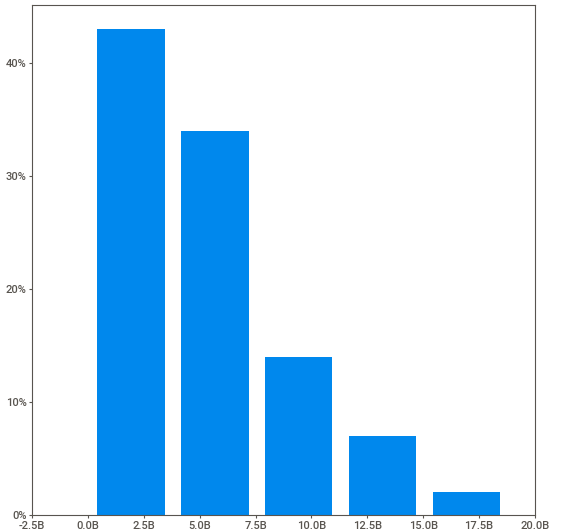
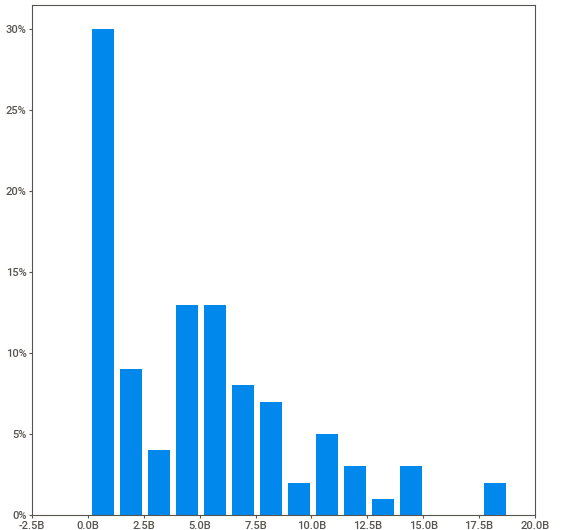
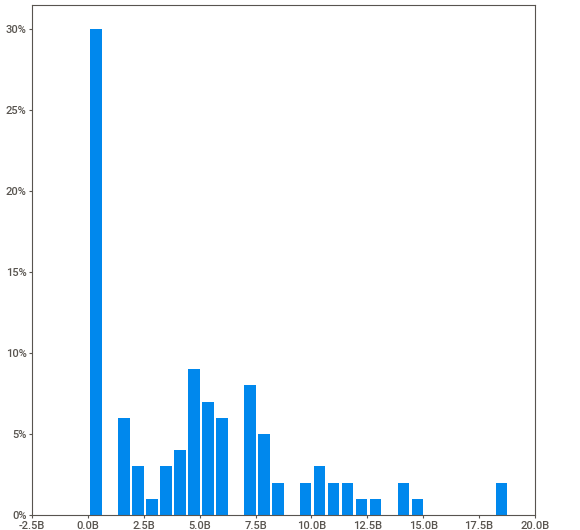
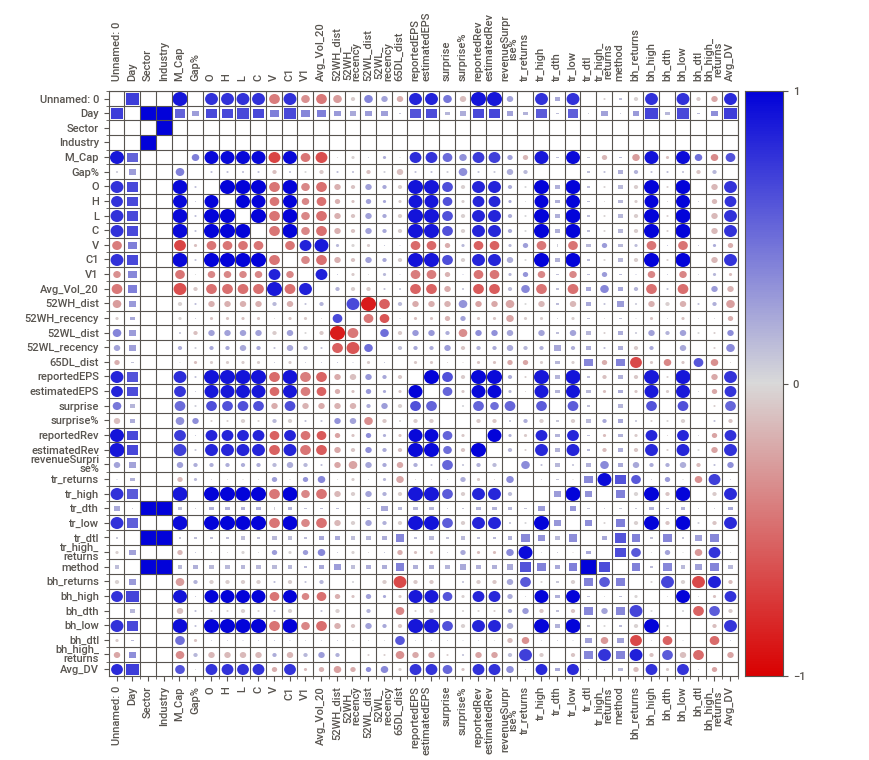
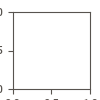

In [10]:
# Here is an example of feature_config to skip the PassengerId feature, and force age to be interpreted as categories:
# -> Using a SMALL WINDOW just to show the concept!
# feature_config = sv.FeatureConfig(skip="PassengerId", force_text=["Age"])
analyze_report = sv.analyze(df)
# analyze_report.show_notebook(w=900, h=450, scale=0.8)
analyze_report.show_notebook()

1. SWEETVIZ (WITH TARGET)

/opt/homebrew/lib/python3.10/site-packages/sweetviz/dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
/opt/homebrew/lib/python3.10/site-packages/sweetviz/dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()
Feature: bh_high_returns (TARGET)            |▏         | [  2%]   00:00 -> (00:00 left)/opt/homebrew/lib/python3.10/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
Feature: Unnamed: 0                          |▍         | [  5%]   00:00 -> (00:05 left)/opt/homebrew/lib/pyt


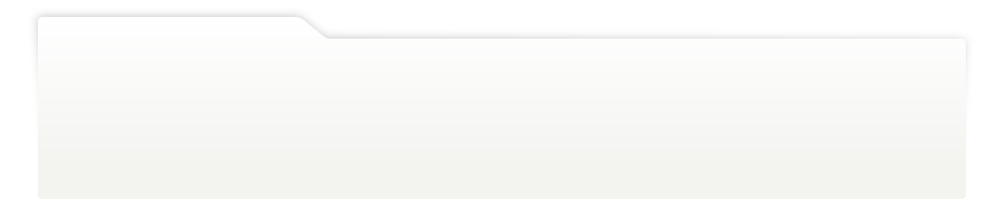
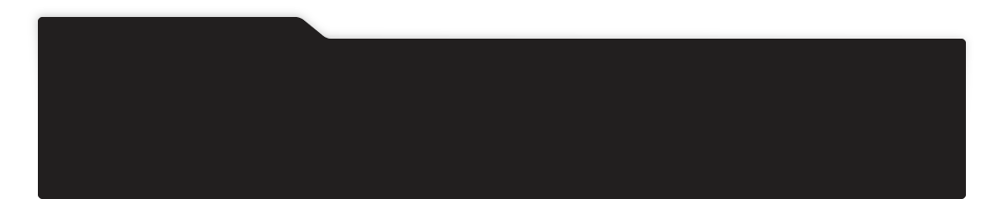
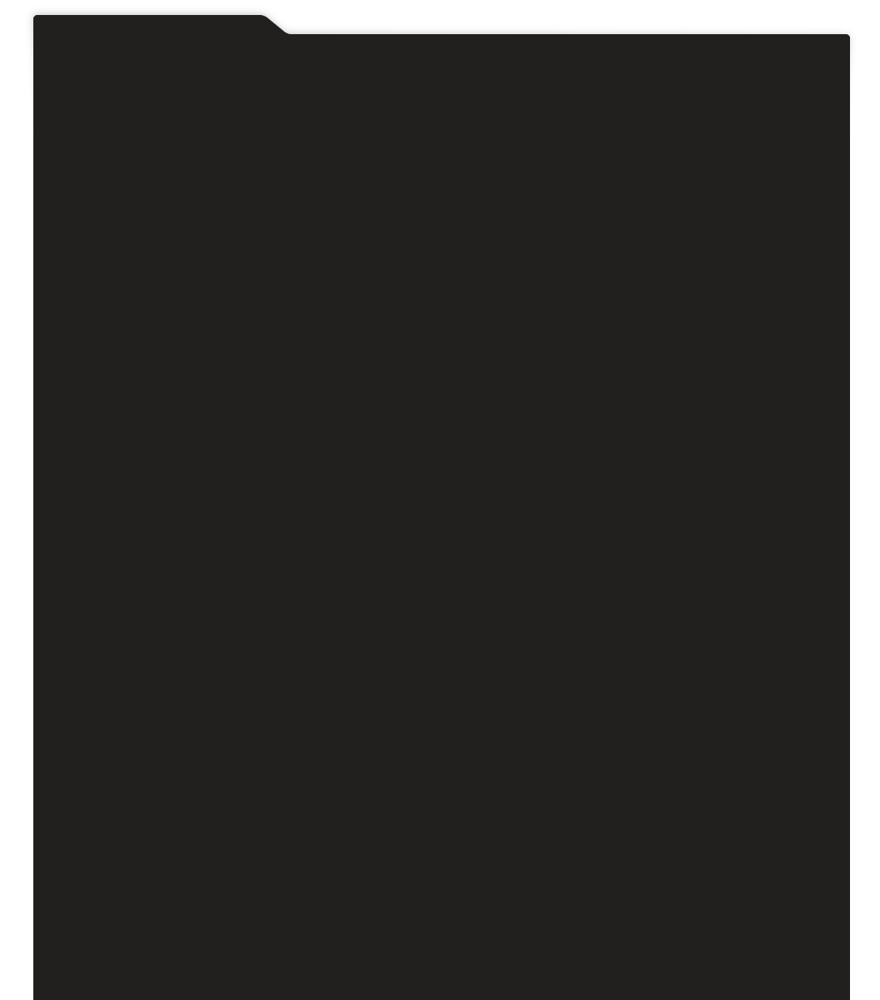
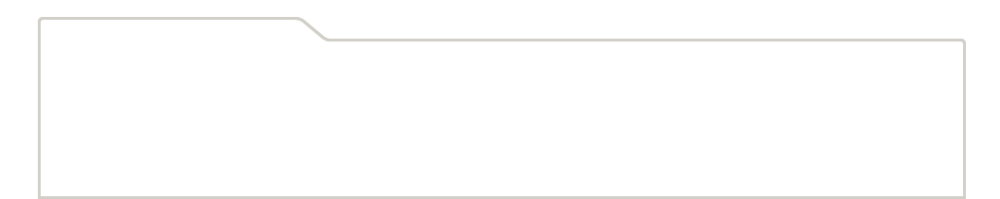
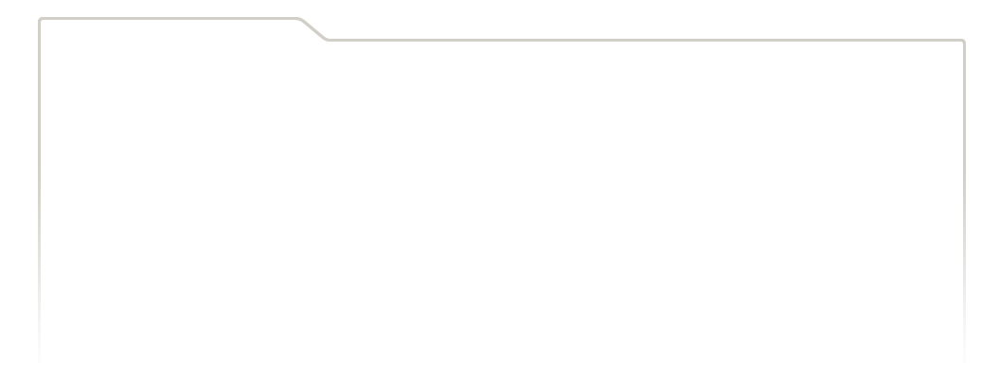
...
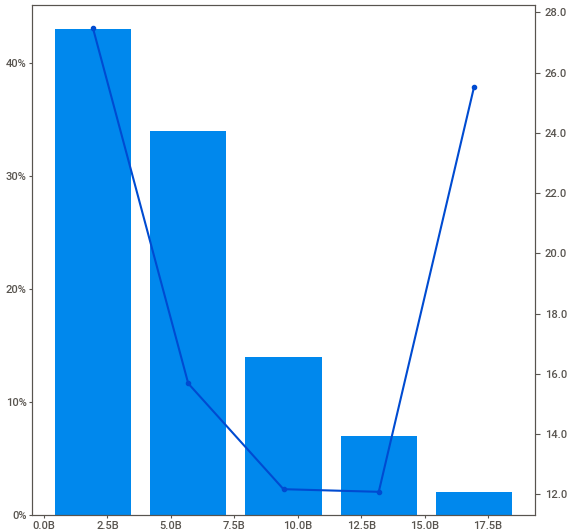
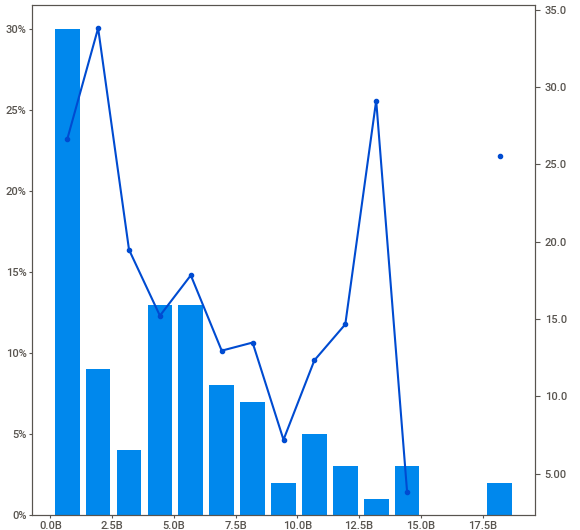
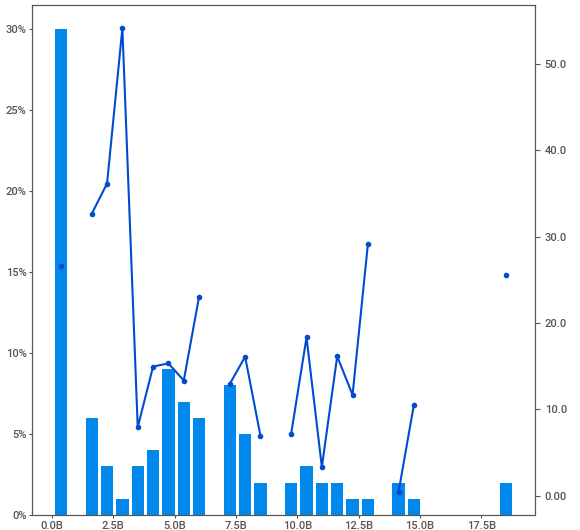
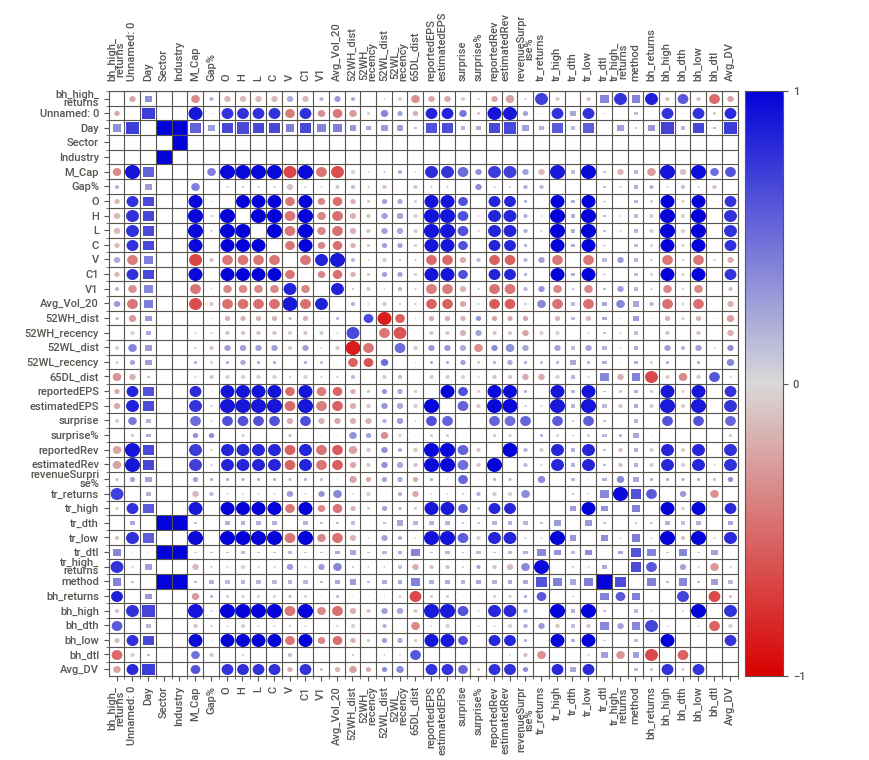
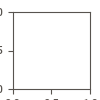

In [12]:
# Here is an example of feature_config to skip the PassengerId feature, and force age to be interpreted as categories:
# -> Using a SMALL WINDOW just to show the concept!
# feature_config = sv.FeatureConfig(skip="PassengerId", force_text=["Age"])
analyze_report = sv.analyze(df, target_feat='bh_high_returns')
# analyze_report.show_notebook(w=900, h=450, scale=0.8)

In [13]:
analyze_report.show_html()

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


2. AUTOVIZ

In [15]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [16]:
sep = ','
dft = AV.AutoViz(filename="",sep=sep, depVar='bh_high_returns', dfte=df, header=0, verbose=2, 
                 lowess=False, chart_format='html', max_rows_analyzed=150000, max_cols_analyzed=50)

Shape of your Data Set loaded: (100, 43)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Unnamed: 0,100,int64,0,0.000000,100.000000,0,possible ID column: drop
V,100,int64,0,0.000000,100.000000,0,possible ID column: drop
estimatedRev,100,int64,0,0.000000,100.000000,0,possible ID column: drop
T0,100,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
Avg_Vol_20,100,float64,0,0.000000,100.000000,0,skewed: cap or drop outliers
V1,100,int64,0,0.000000,100.000000,0,possible ID column: drop
Avg_DV,100,float64,0,0.000000,100.000000,0,
ReportingPeriod,100,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
T1,100,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
bh_returns,98,float64,0,0.000000,98.000000,0,


  Printing upto 30 columns max in each category:
    Numeric Columns : ['M_Cap', 'Gap%', 'O', 'H', 'L', 'C', 'C1', 'Avg_Vol_20', '52WH_dist', '52WL_dist', '65DL_dist', 'reportedEPS', 'estimatedEPS', 'surprise', 'surprise%', 'reportedRev', 'revenueSurprise%', 'tr_returns', 'tr_high', 'tr_low', 'tr_high_returns', 'bh_returns', 'bh_high', 'bh_low', 'Avg_DV']
    Integer-Categorical Columns: ['52WH_recency', '52WL_recency', 'bh_dth', 'bh_dtl']
    String-Categorical Columns: ['Day']
    Factor-Categorical Columns: []
    String-Boolean Columns: ['method']
    Numeric-Boolean Columns: ['tr_dth', 'tr_dtl']
    Discrete String Columns: []
    NLP text Columns: []
    Date Time Columns: []
    ID Columns: ['Unnamed: 0', 'T0', 'T1', 'ReportingPeriod', 'V', 'V1', 'estimatedRev']
    Columns that will not be considered in modeling: ['Sector', 'Industry']
    42 Predictors classified...
        9 variables removed since they were ID or low-information variables
        List of variables removed: [

In [17]:
os.getcwd()

'/Users/yash/Desktop/Trading/EP/gap'